In [ ]:
# Importig the libraries
import torch, torchvision, PIL, os, pdb
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def show(tensor, num=25, wandbactive=0, name=''):
  data = tensor.detach().cpu()
  grid = make_grid(data[:num], nrow=5).permute(1, 2, 0)

  if (wandbactive==1):
    wandb.log({name:wandb.Image(grid.numpy().clip(0, 1))})

  plt.imshow(grid.clip(0, 1))
  plt.show()


## Hyperparameters and general parameters
n_epochs = 10000
batch_size = 128
lr = 1e-4
z_dim = 200
device = 'cuda'

cur_step = 0
crit_cycles = 5
gen_losses = []
crit_losses = []
show_step = 100
save_step = 100

wandbact = 1 # Yes we want to track stats thru weights and biases


In [ ]:
!pip install wandb -qqq
import wandb
wandb.login(key='ea415b834084f3f3f8f1cd88d94b209cd5b0a1e2')

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


True

In [ ]:
%%capture
experiment_name = wandb.util.generate_id()

myrun = wandb.init(
    project = "wgan",
    group = experiment_name,
    config = {
        "optimizer": "adam",
        "model": "wgan gp",
        "epoch": "1000",
        "batch_size": 128
    }
)

config = wandb.config


In [ ]:

print(experiment_name)

nk67otqg


In [ ]:
# Generator model

class Generator(nn.Module):
  def __init__(self, z_dim=64, d_dim=16):
    super(Generator, self).__init__()
    self.z_dim = z_dim

    self.gen = nn.Sequential(
        # ConvTranspose2D: in_channels, out_channels, kernel_size, stride=1, padding=0
        # Calculate new width and height: (n-1) * stride - 2*padding + ks (ConvTranspose2D)
        # begin with a 1x1 image with z_dim number of channels (200)
        nn.ConvTranspose2d(z_dim, d_dim * 32, 4, 1, 0), ## 4x4 (ch: 200 -> 512)
        nn.BatchNorm2d(d_dim * 32),
        nn.ReLU(True),

        nn.ConvTranspose2d(d_dim*32, d_dim * 16, 4, 2, 1), # 8x8 (ch: 512 -> 256)
        nn.BatchNorm2d(d_dim * 16),
        nn.ReLU(True),

        nn.ConvTranspose2d(d_dim * 16, d_dim * 8, 4, 2, 1), #16x16 (ch: 256 -> 128)
        nn.BatchNorm2d(d_dim * 8),
        nn.ReLU(True),
        
        nn.ConvTranspose2d(d_dim * 8, d_dim * 4, 4, 2, 1), #32x32 (ch: 128 -> 64)
        nn.BatchNorm2d(d_dim * 4),
        nn.ReLU(True),
        
        nn.ConvTranspose2d(d_dim * 4, d_dim * 2, 4, 2, 1), #64x64 (ch: 64 -> 32)
        nn.BatchNorm2d(d_dim * 2),
        nn.ReLU(True),

        nn.ConvTranspose2d(d_dim * 2, 3, 4, 2, 1), #128x128 (ch: 32 -> 3)
        nn.Tanh() # Produce result in range -1 to 1
    )

  def forward(self, noise):
    x = noise.view(len(noise), self.z_dim, 1, 1) # 128(batch size) x 200(channels) x 1 x 1
    return self.gen(x)

In [ ]:
def gen_noise(number, z_dim, device='cuda'):
  return torch.randn(number, z_dim, device=device)

**nn.Conv2d:** Typically reduces size of the input(we increase number of channels to compensate). Used in critic to go from full size image to the prediction (size 1) </br>
<i>new width = (n + 2*pad - ks)//stride + 1</i>
</br>
</br>
**nn.ConvTranspose2d:** Typically increases the size of the input(we reduce the number of channels to compensate). Used in the generator to go from a 1 x 1 noise vector with a number of channels to a full sized image.</br>
<i>new width = (n - 1)*stride - 2*pad + ks</i>
</br>
</br>
pad: padding</br>
stride: the amount by which the kernel is moved in every slide</br>
ks: kernel size</br>
n: old width or height of the image

In [ ]:
# CRITIC MODEL


class Critic(nn.Module):
  def __init__(self, d_dim=16):
    super(Critic, self).__init__()

    self.crit = nn.Sequential(
        # Conv2d: in_channels, out_chanels, kernel_size, stride=1, padding=0
        # new width and height: (n + 2*pad - ks)//stride + 1
        # initial image: 128x128, 3 channel
        nn.Conv2d(3, d_dim, 4, 2, 1), # 64 x 64 (ch: 3 -> 16)
        nn.InstanceNorm2d(d_dim),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim, d_dim * 2, 4, 2, 1), # 32x32 (ch: 16 -> 32)
        nn.InstanceNorm2d(d_dim*2),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim * 2, d_dim * 4, 4, 2, 1), # 16x16 (ch: 32 -> 64)
        nn.InstanceNorm2d(d_dim*4),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim * 4, d_dim * 8, 4, 2, 1), # 8x8 (ch: 64 -> 128)
        nn.InstanceNorm2d(d_dim*8),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim * 8, d_dim * 16, 4, 2, 1), # 4x4 (ch: 128 -> 256)
        nn.InstanceNorm2d(d_dim*16),
        nn.LeakyReLU(0.2),

        nn.Conv2d(d_dim * 16, 1, 4, 1, 0), # 1x1 (ch: 256 -> 1)

    )

  def forward(self, image):
    crit_pred = self.crit(image) # 128(batch size) x 1(channels) x 1 x 1
    return crit_pred.view(len(crit_pred), -1) # 128 x 1


In [ ]:
# Loading the celebA dataset
import gdown, zipfile
url = "https://drive.google.com/uc?id=1-JkyoNeL6Srw69c1uClGGlABMHaO4riL"
path = 'data/celeba'
download_path = f'{path}/img_align_celeba.zip'

if not os.path.exists(path):
  os.makedirs(path)

gdown.download(url, download_path, quiet=False)

with zipfile.ZipFile(download_path, 'r') as ziphandler:
  ziphandler.extractall(path)


Downloading...
From: https://drive.google.com/uc?id=1-JkyoNeL6Srw69c1uClGGlABMHaO4riL
To: /content/data/celeba/img_align_celeba.zip
100%|██████████| 1.44G/1.44G [00:07<00:00, 185MB/s]


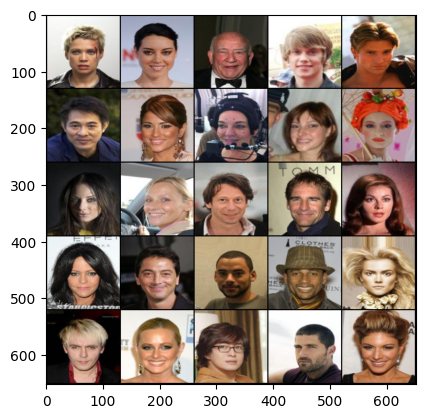

In [ ]:
# Dataset, dataloader, declare gen, crit, test dataset

class Dataset(Dataset):
  def __init__(self, path, size=128, lim=50000):
    self.sizes = [size, size]
    items, labels = [], []


    for data in os.listdir(path)[:lim]:
        item = os.path.join(path, data)
        items.append(item)
        labels.append(data)
    self.items = items
    self.labels = labels

  def __len__(self):
    return len(self.items)

  def __getitem__(self, idx):
    data = PIL.Image.open(self.items[idx]).convert('RGB')
    data = np.asarray(torchvision.transforms.Resize(self.sizes)(data))
    data = np.transpose(data, (2, 0, 1)).astype(np.float32)
    data = torch.from_numpy(data).div(255)
    return data, self.labels[idx]

# Dataset
data_path = './data/celeba/img_align_celeba'
ds = Dataset(data_path, size=128, lim=50000)

# DataLader
dataloader = DataLoader(ds, batch_size=batch_size, shuffle=True)

# Models
gen = Generator(z_dim).to(device)
crit = Critic().to(device)

# Optimizers
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.9))
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(0.5, 0.9))

# wandb
if (wandbact == 1):
  wandb.watch(gen, log_freq=100)
  wandb.watch(crit, log_freq=100)

x, y = next(iter(dataloader))
show(x)

In [ ]:
# gradient penalty calculation
def get_gp(real, fake, crit, alpha, gamma=10):
  mix_images = real * alpha + fake * (1-alpha) # 128(bs) x 3 x 128 x 128
  mix_scores = crit(mix_images)

  gradient = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs = torch.ones_like(mix_scores),
      retain_graph = True,
      create_graph = True
  )[0]

  gradient = gradient.view(len(gradient), -1)
  gradient_norm = gradient.norm(2, dim = 1)
  gp = gamma*((gradient_norm-1)**2).mean()
  return gp

In [ ]:
# Save and load checkpints
root_path = './data/'

def save_checkpoint(name):
  torch.save({
      'epoch': epoch,
      'model_state_dict': gen.state_dict(),
      'optimizer_state_dict': gen_opt.state_dict()
  }, f'{root_path}G-{name}.pkl')

  torch.save({
      'epoch': epoch,
      'model_state_dict': crit.state_dict(),
      'optimizer_state_dict': crit_opt.state_dict()
  }, f'{root_path}C-{name}.pkl')

  print("Saved Checkpoint")


def load_checkpoint(name):
  checkpoint = torch.load(f"{root_path}G-{name}.pkl")
  gen.load_state_dict(checkpoint['model_state_dict'])
  gen_opt.load_state_dict(checkpoint['optimizer_state_dict'])

  checkpoint = torch.load(f"{root_path}C-{name}.pkl")
  crit.load_state_dict(checkpoint['model_state_dict'])
  crit_opt.load_state_dict(checkpoint['optimizer_state_dict'])

  print("Loaded Checkpoint")


  0%|          | 0/391 [00:00<?, ?it/s]

Saving checkpoint:  100 100
Saved Checkpoint


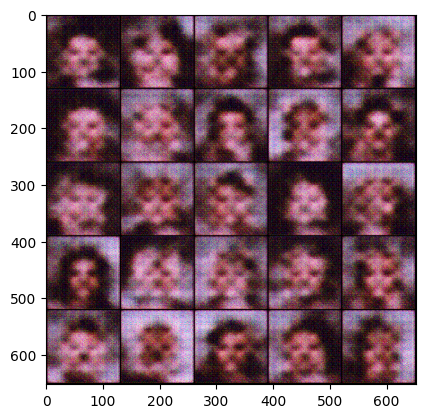

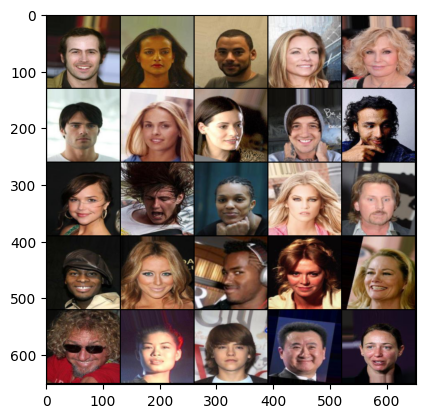

Epoch: 0 : Step 100: Generator loss: 20.03677764892578, Critic loss: -20.620787447929388


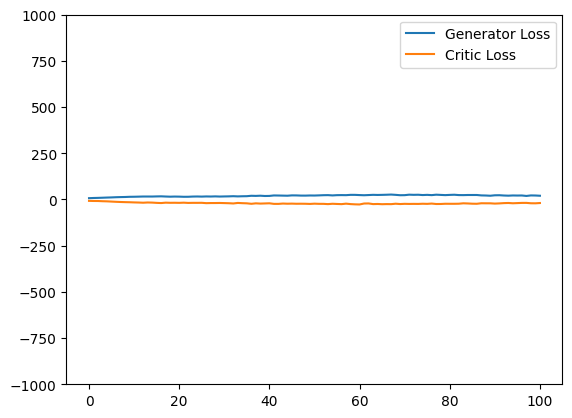

Saving checkpoint:  200 100
Saved Checkpoint


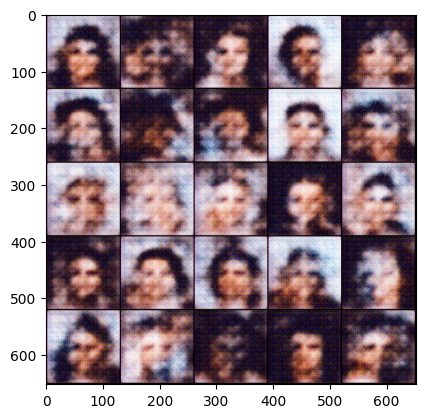

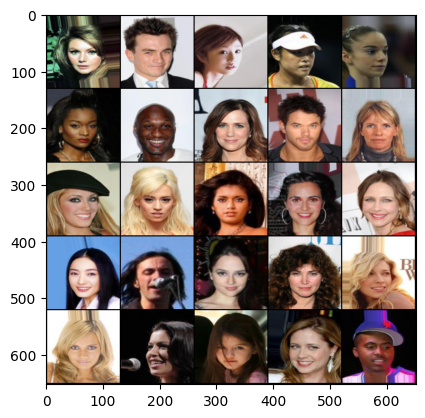

Epoch: 0 : Step 200: Generator loss: 19.958361644744873, Critic loss: -17.343029785156254


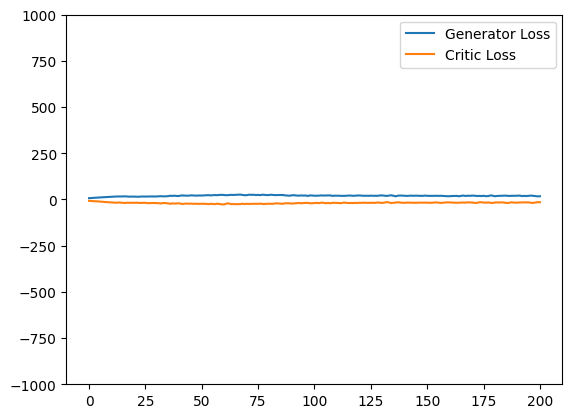

Saving checkpoint:  300 100
Saved Checkpoint


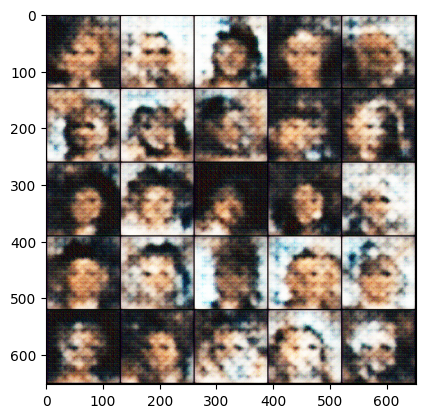

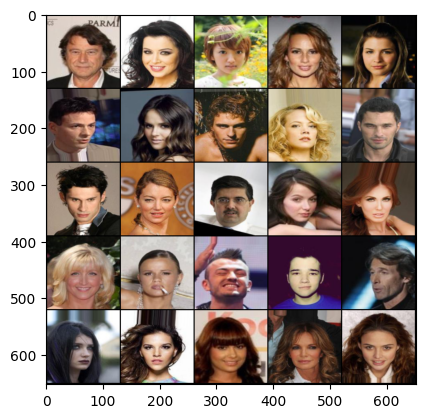

Epoch: 0 : Step 300: Generator loss: 19.535530776977538, Critic loss: -14.719884780883788


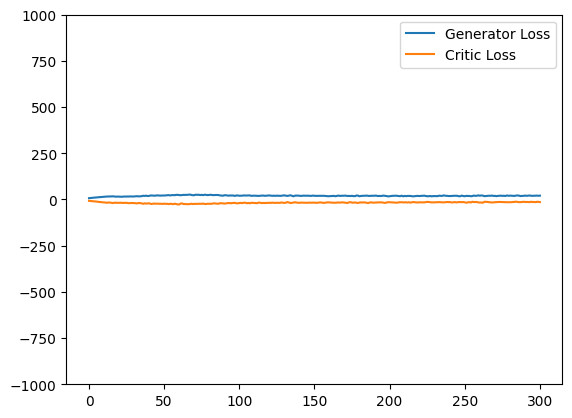

  0%|          | 0/391 [00:00<?, ?it/s]

Saving checkpoint:  400 100
Saved Checkpoint


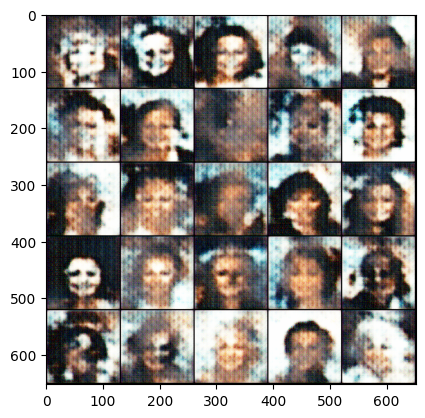

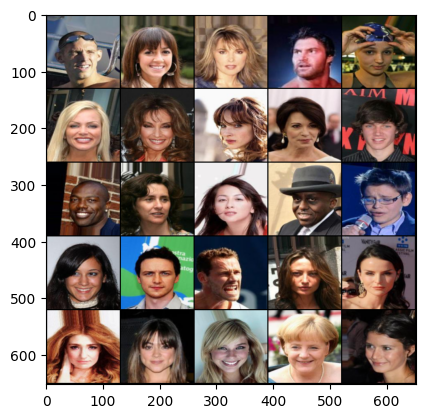

Epoch: 1 : Step 400: Generator loss: 18.667481813430786, Critic loss: -12.311373094558714


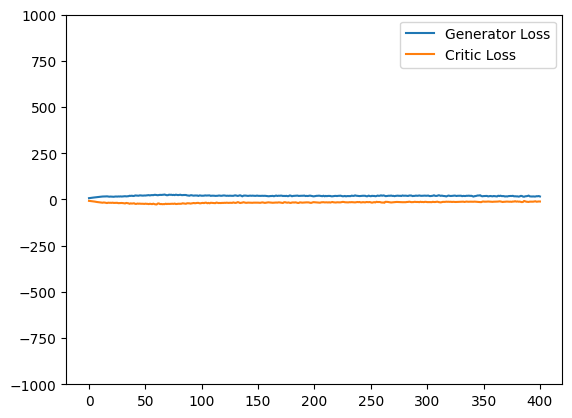

Saving checkpoint:  500 100
Saved Checkpoint


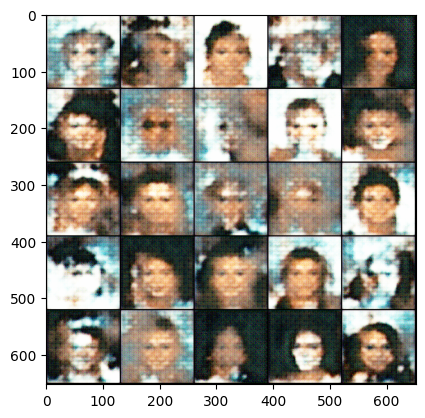

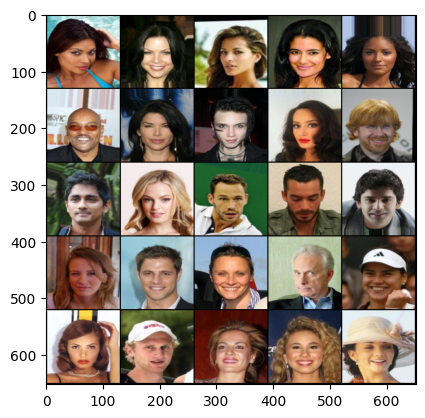

Epoch: 1 : Step 500: Generator loss: 16.404379463195802, Critic loss: -10.516468921661378


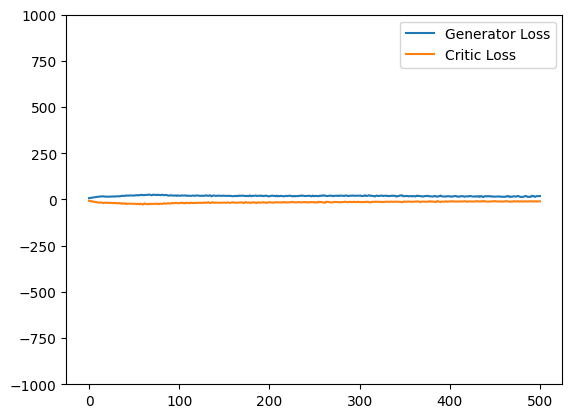

Saving checkpoint:  600 100
Saved Checkpoint


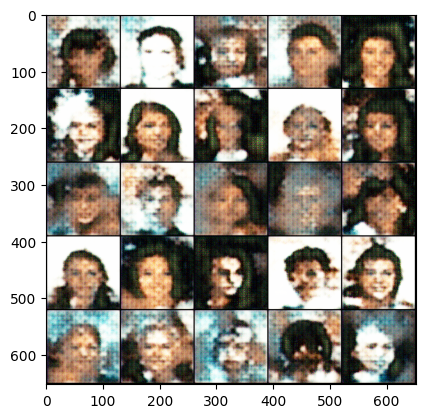

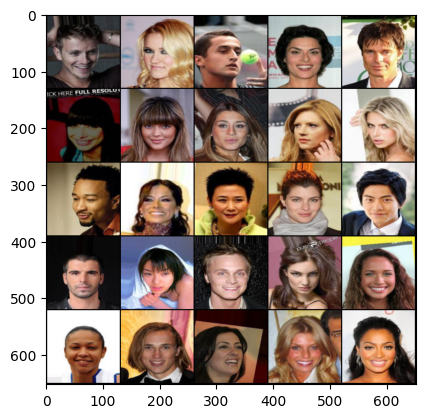

Epoch: 1 : Step 600: Generator loss: 16.212215337753296, Critic loss: -9.545438055992122


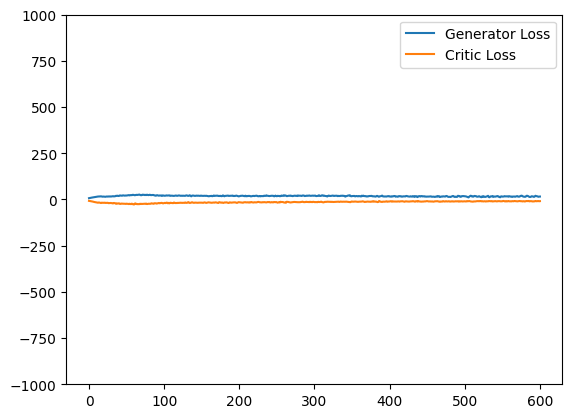

Saving checkpoint:  700 100
Saved Checkpoint


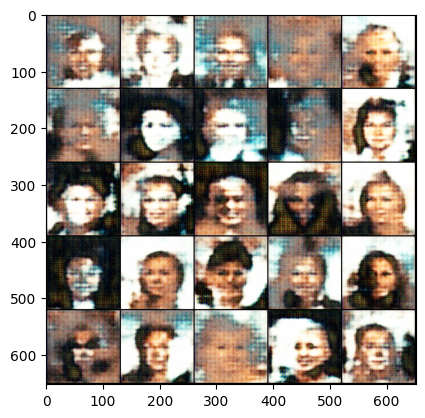

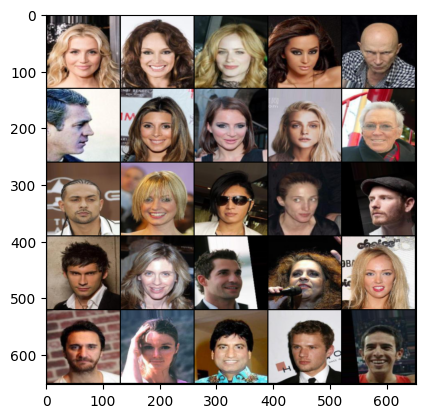

Epoch: 1 : Step 700: Generator loss: 16.732239055633546, Critic loss: -9.074962027549741


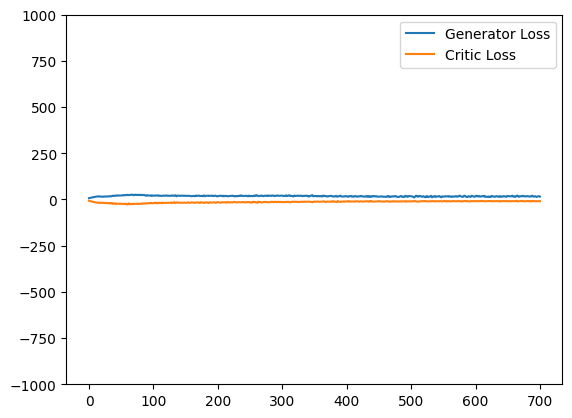

  0%|          | 0/391 [00:00<?, ?it/s]

Saving checkpoint:  800 100
Saved Checkpoint


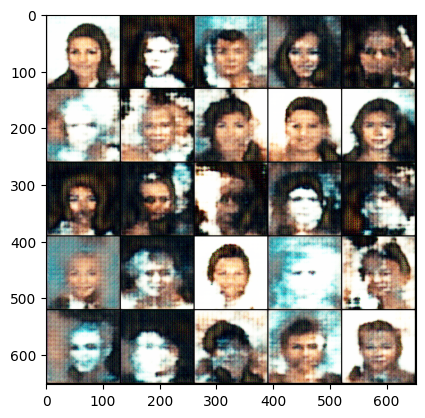

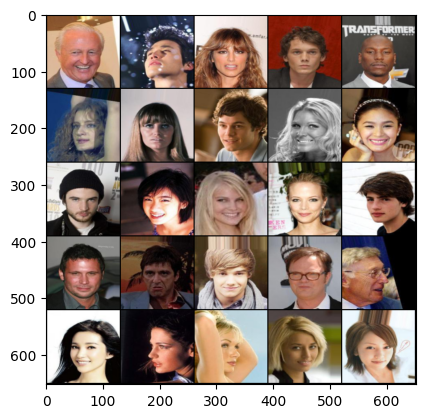

Epoch: 2 : Step 800: Generator loss: 16.711117601394655, Critic loss: -8.994640837669373


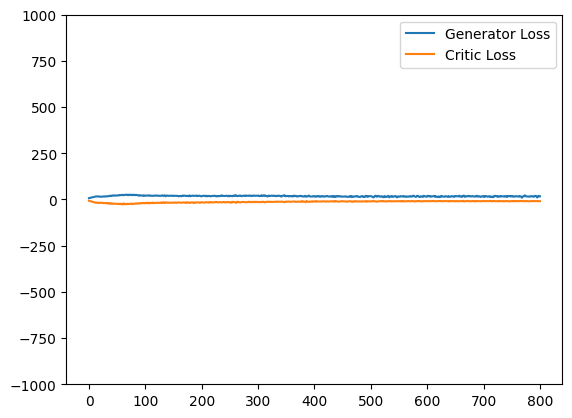

Saving checkpoint:  900 100
Saved Checkpoint


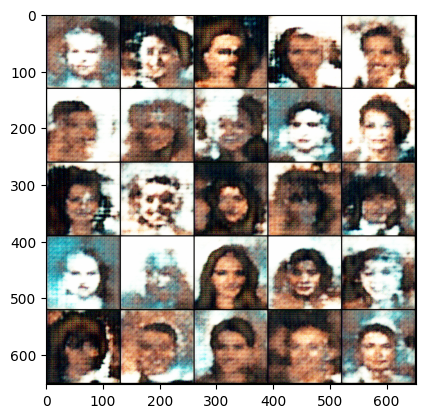

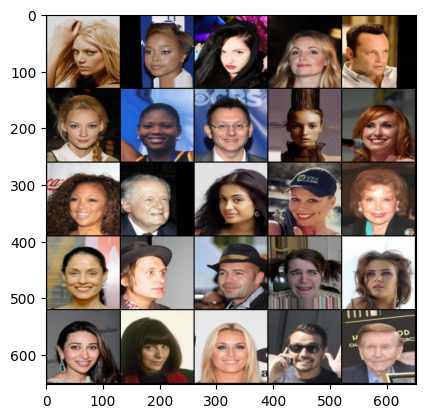

Epoch: 2 : Step 900: Generator loss: 16.619528646469117, Critic loss: -8.918757264137268


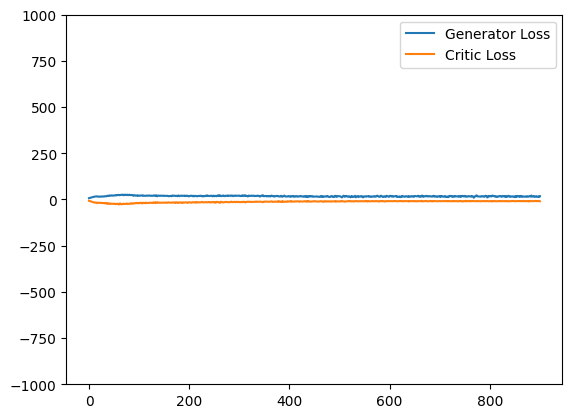

Saving checkpoint:  1000 100
Saved Checkpoint


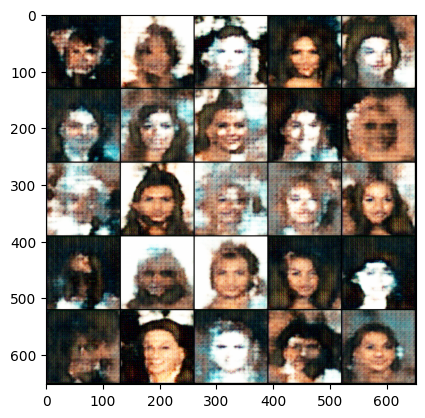

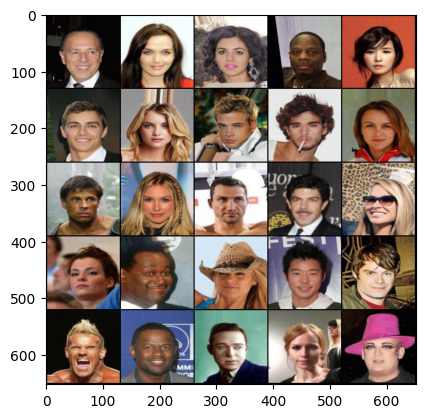

Epoch: 2 : Step 1000: Generator loss: 15.879485301971435, Critic loss: -8.60700547504425


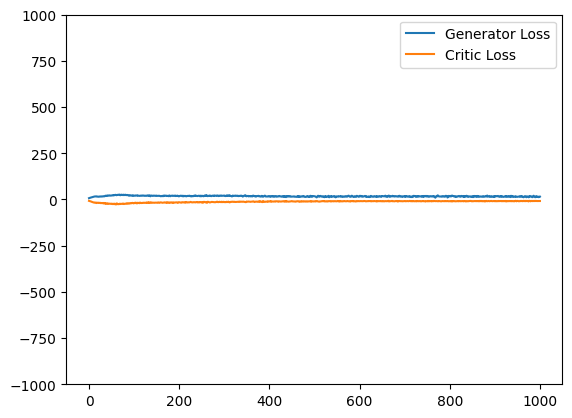

Saving checkpoint:  1100 100
Saved Checkpoint


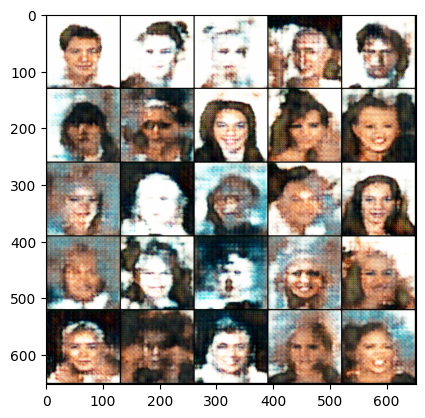

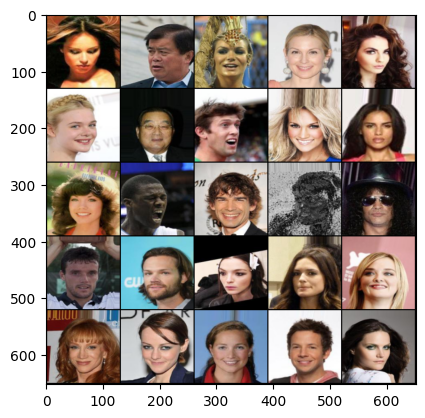

Epoch: 2 : Step 1100: Generator loss: 15.072270803451538, Critic loss: -8.379997913360592


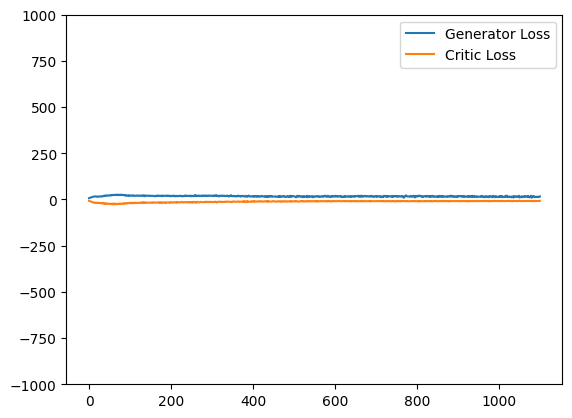

  0%|          | 0/391 [00:00<?, ?it/s]

Saving checkpoint:  1200 100
Saved Checkpoint


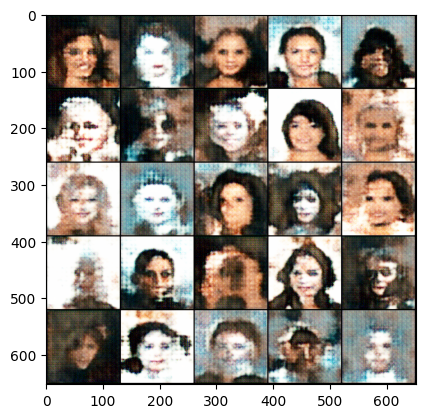

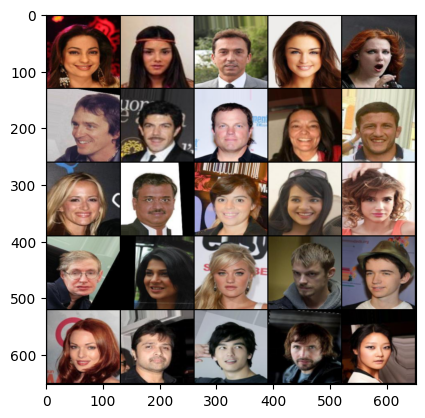

Epoch: 3 : Step 1200: Generator loss: 14.538848991394042, Critic loss: -7.948306292533877


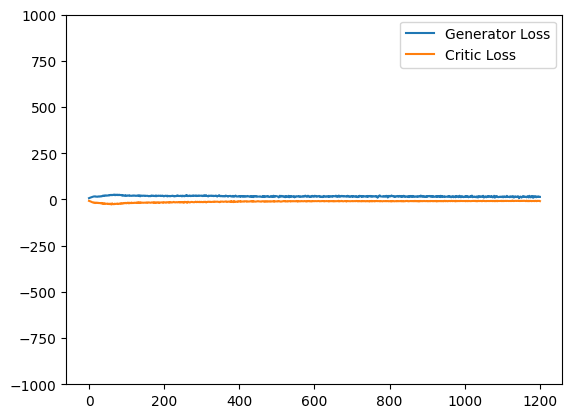

Saving checkpoint:  1300 100
Saved Checkpoint


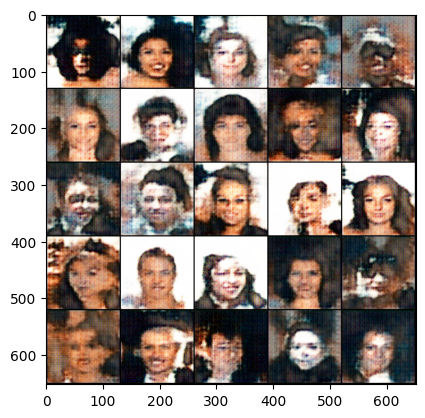

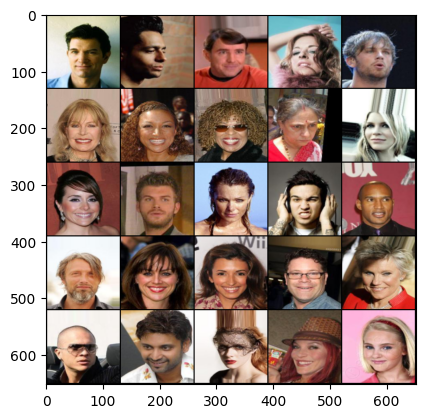

Epoch: 3 : Step 1300: Generator loss: 14.383257913589478, Critic loss: -7.846882773399349


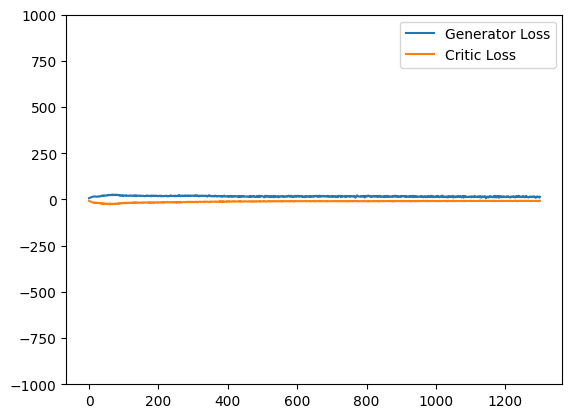

Saving checkpoint:  1400 100
Saved Checkpoint


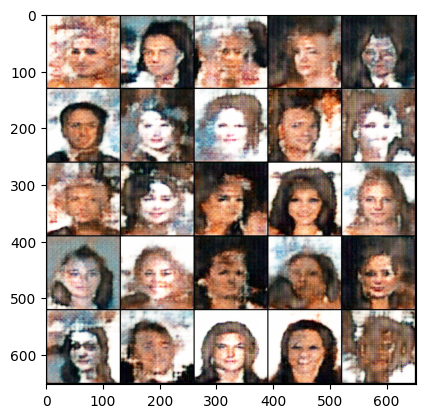

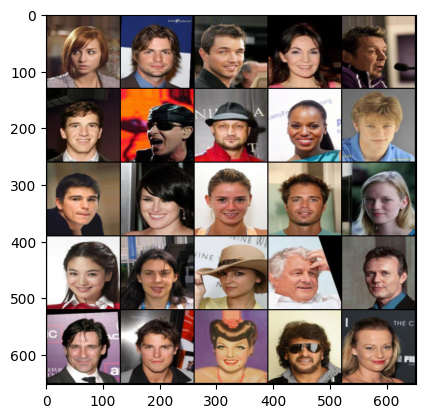

Epoch: 3 : Step 1400: Generator loss: 13.794634857177734, Critic loss: -7.378919602394102


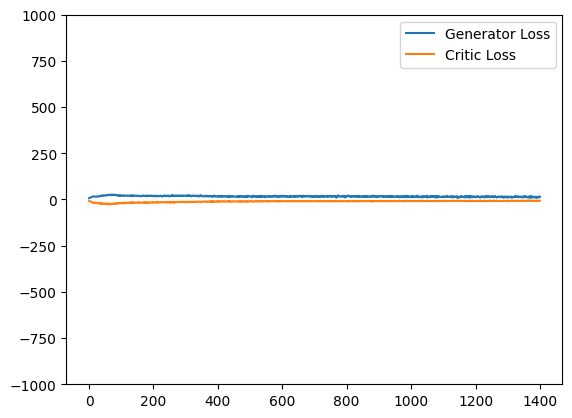

Saving checkpoint:  1500 100
Saved Checkpoint


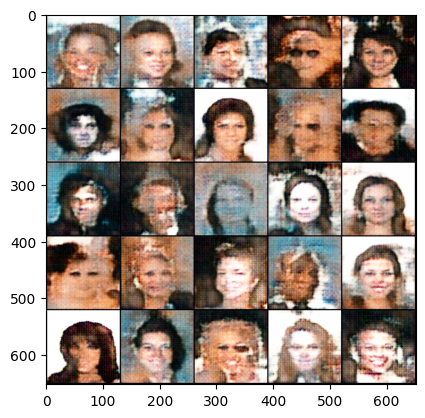

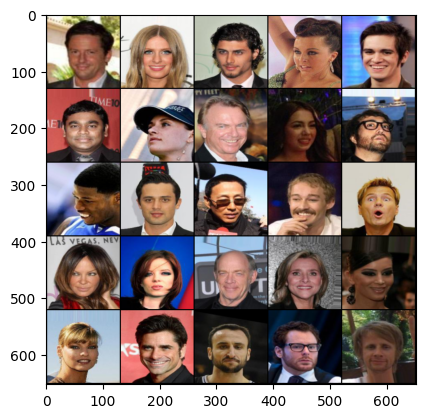

Epoch: 3 : Step 1500: Generator loss: 13.434153785705567, Critic loss: -7.1980385613441475


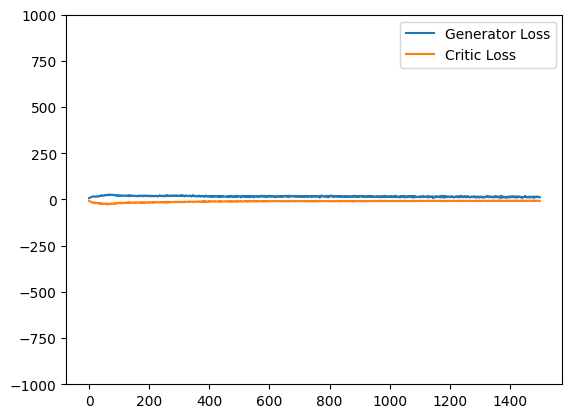

  0%|          | 0/391 [00:00<?, ?it/s]

Saving checkpoint:  1600 100
Saved Checkpoint


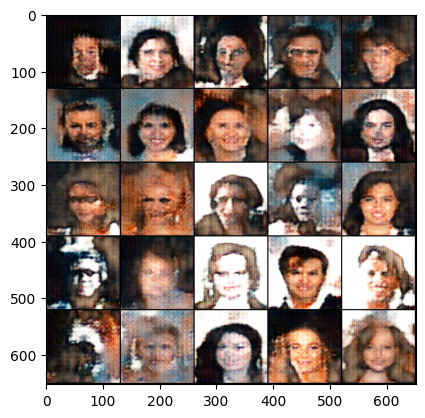

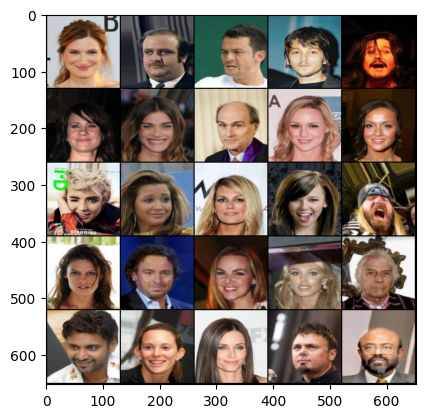

Epoch: 4 : Step 1600: Generator loss: 13.514176788330078, Critic loss: -6.948383385658263


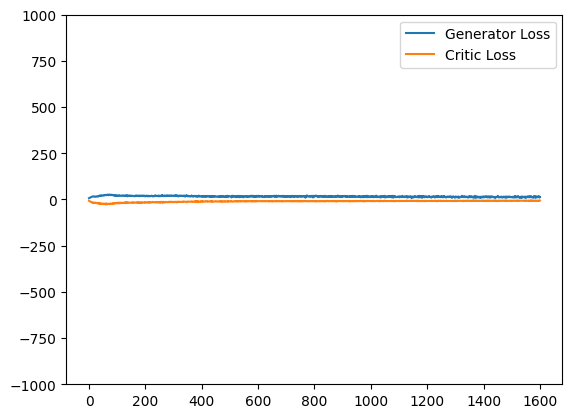

Saving checkpoint:  1700 100
Saved Checkpoint


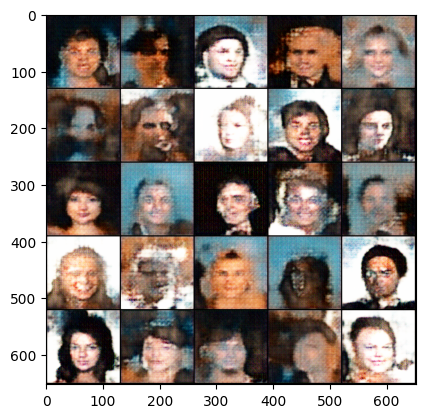

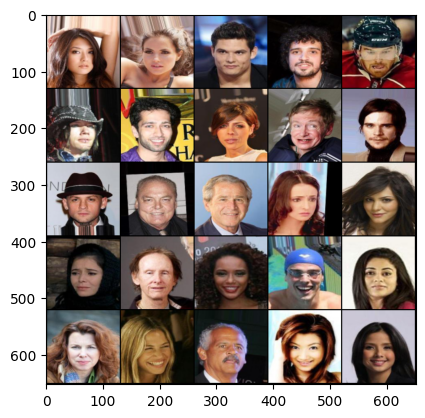

Epoch: 4 : Step 1700: Generator loss: 12.690271902084351, Critic loss: -6.853410286903378


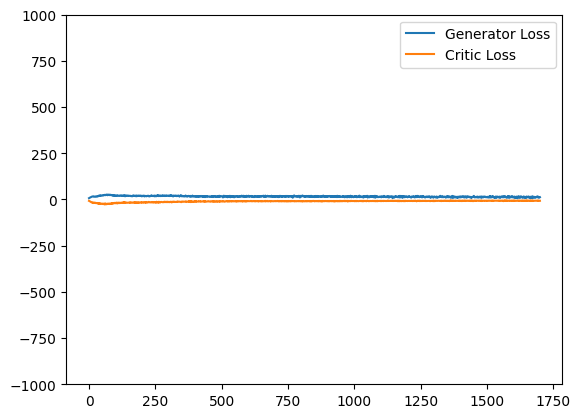

Saving checkpoint:  1800 100
Saved Checkpoint


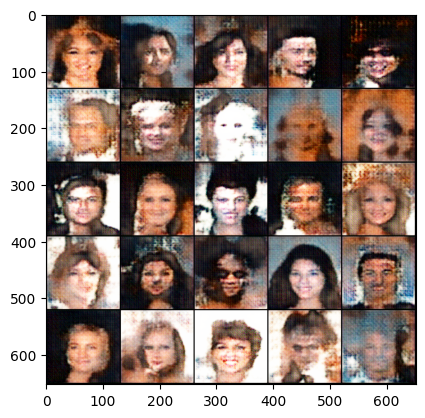

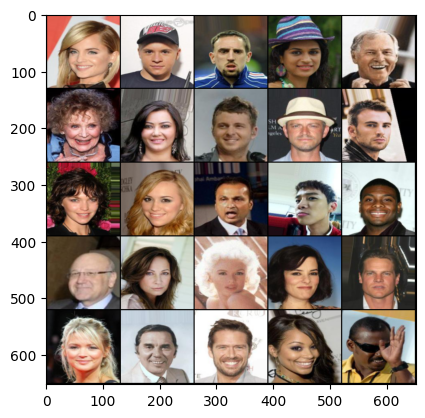

Epoch: 4 : Step 1800: Generator loss: 13.117193145751953, Critic loss: -6.6204348015785195


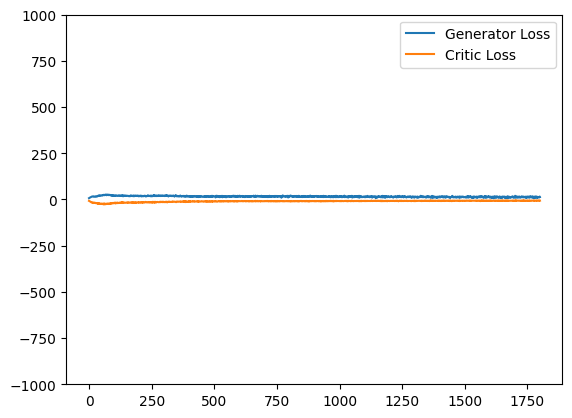

Saving checkpoint:  1900 100
Saved Checkpoint


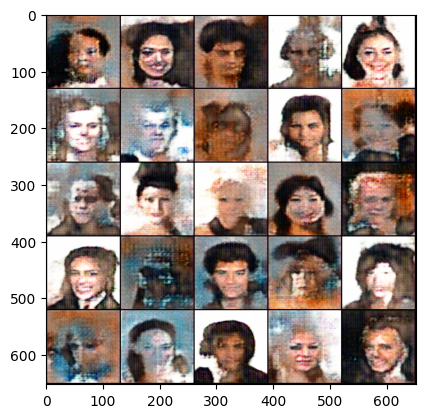

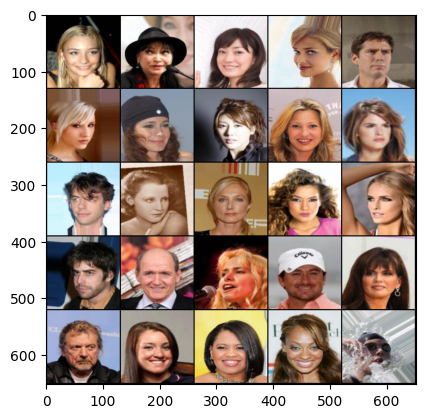

Epoch: 4 : Step 1900: Generator loss: 12.076606411933898, Critic loss: -6.441486722946169


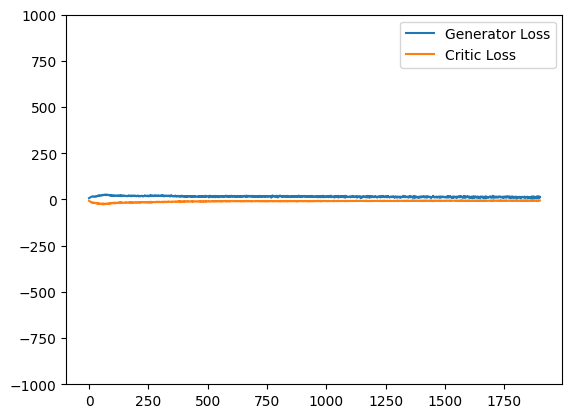

  0%|          | 0/391 [00:00<?, ?it/s]

Saving checkpoint:  2000 100
Saved Checkpoint


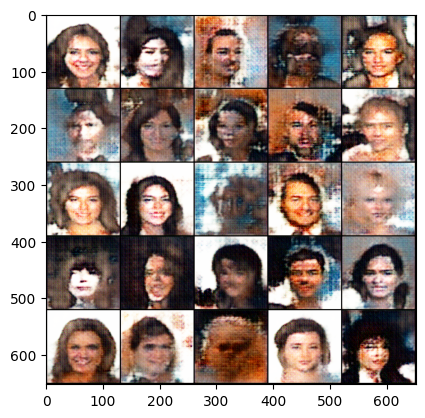

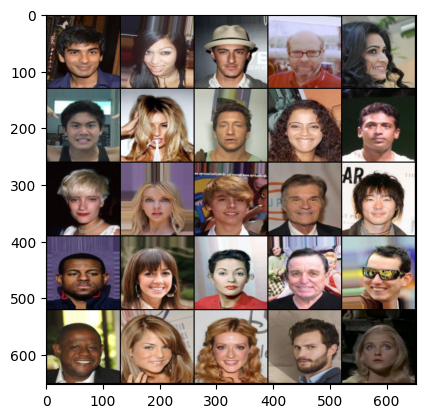

Epoch: 5 : Step 2000: Generator loss: 11.723301415443421, Critic loss: -6.329896155834199


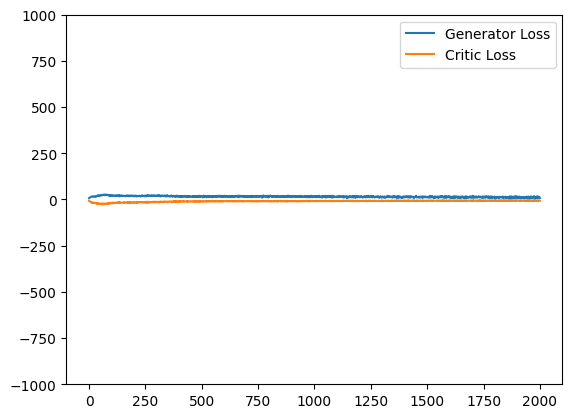

Saving checkpoint:  2100 100
Saved Checkpoint


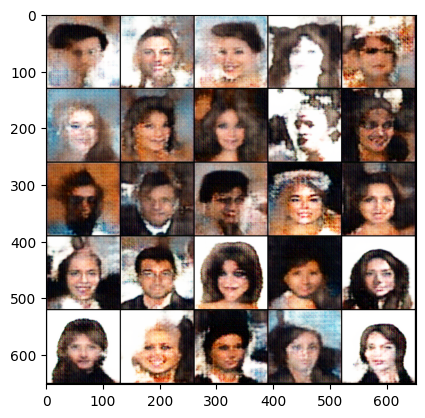

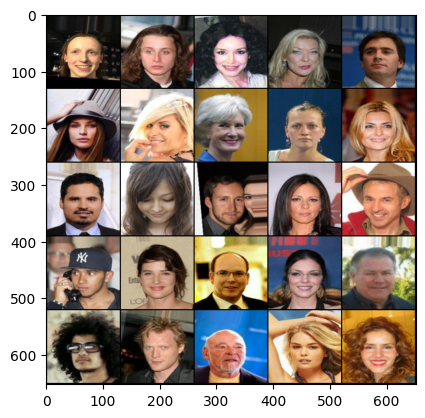

Epoch: 5 : Step 2100: Generator loss: 11.751937112808228, Critic loss: -6.1697074556350735


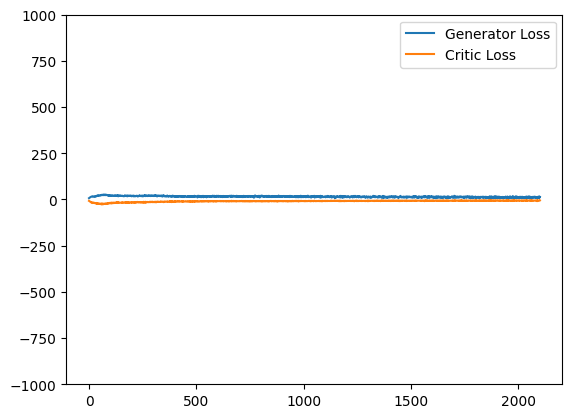

Saving checkpoint:  2200 100
Saved Checkpoint


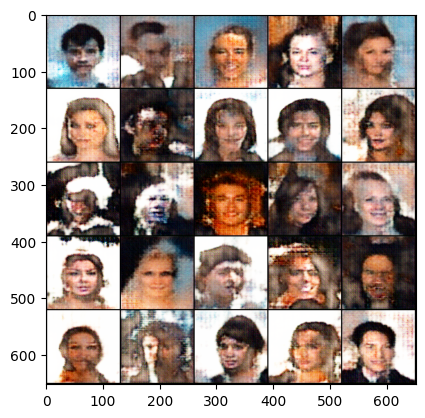

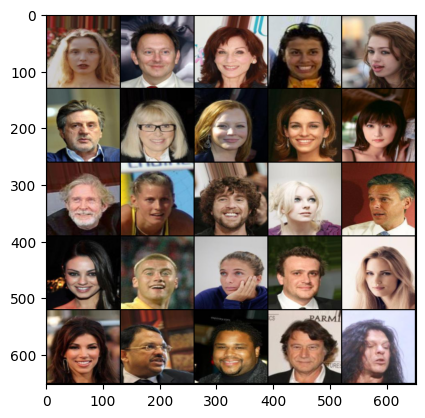

Epoch: 5 : Step 2200: Generator loss: 11.187441749572754, Critic loss: -6.1080768890380845


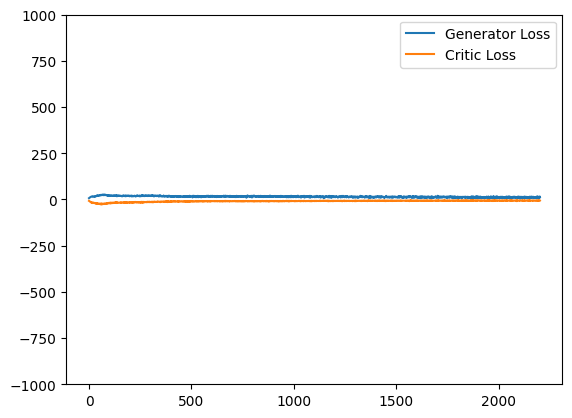

Saving checkpoint:  2300 100
Saved Checkpoint


In [ ]:
# Training loop
for epoch in range(n_epochs):
  for real, _ in tqdm(dataloader):
    cur_bs = len(real) #128
    real = real.to(device)

    # Critic
    mean_crit_loss = 0
    for _ in range(crit_cycles):
      crit_opt.zero_grad()

      noise = gen_noise(cur_bs, z_dim)
      fake = gen(noise)
      crit_fake_pred = crit(fake.detach())
      crit_real_pred = crit(real)

      alpha = torch.rand(len(real), 1, 1, 1, device = device, requires_grad=True)
      gp = get_gp(real, fake.detach(), crit, alpha)

      crit_loss = crit_fake_pred.mean() - crit_real_pred.mean() + gp

      mean_crit_loss += crit_loss.item()/crit_cycles
      
      crit_loss.backward(retain_graph = True)
      crit_opt.step()

    crit_losses += [mean_crit_loss]

    # Generator
    gen_opt.zero_grad()
    noise = gen_noise(cur_bs, z_dim)
    fake = gen(noise)
    crit_fake_pred = crit(fake)
    
    gen_loss = -crit_fake_pred.mean()
    gen_loss.backward()
    gen_opt.step()

    gen_losses += [gen_loss.item()]

    # Stats
    if wandbact==1:
      wandb.log({'Epoch': epoch, 'Step': cur_step, 'Critic loss': mean_crit_loss, 'Gen loss': gen_loss})

    if cur_step % save_step == 0 and cur_step > 0:
      print('Saving checkpoint: ', cur_step, save_step)
      save_checkpoint("latest")
    
    if(cur_step % show_step == 0 and cur_step > 0):
      show(fake, wandbactive=1, name='fake')
      show(real, wandbactive=1, name='real')

      gen_mean = sum(gen_losses[-show_step:]) / show_step
      crit_mean = sum(crit_losses[-show_step:])/show_step
      print(f"Epoch: {epoch} : Step {cur_step}: Generator loss: {gen_mean}, Critic loss: {crit_mean}")

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(gen_losses),
          label = 'Generator Loss'
      )
      
      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(crit_losses),
          label = 'Critic Loss'
      )

      plt.ylim(-1000, 1000)
      plt.legend()
      plt.show()

    cur_step += 1


In [ ]:
# Generate New faces
noise = gen_noise(batch_size, z_dim)
fake = gen(noise)
show(fake)

In [ ]:
plt.imshow(fake[4].detach().cpu().permute(1, 2, 0).squeeze().clip(0, 1))

In [ ]:
# Morphing, interpolation between points in the latent space
from mpl_toolkits.axes_grid1 import ImageGrid

gen_set = []
z_shape = [1, 200, 1, 1]
rows = 4
steps = 17
for i in range(rows):
  z1, z2 = torch.randn(z_shape), torch.randn(z_shape)
  for alpha in np.linspace(0, 1, steps):
    z = alpha*z1 + (1-alpha)*z2
    res = gen(z.cuda())[0]
    gen_set.append(res)

fig = plt.figure(figsize=(25, 11))
grid = ImageGrid(fig, 111, nrows_ncols=(rows, steps), axes_pad = 0.1)

for ax, img in zip(grid, gen_set):
  ax.axis('off')
  res = img.cpu().detach().permute(1, 2, 0)
  res = res - res.min()
  res = res/(res.max() - res.min())
  ax.imshow(res)
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')